In [1]:
import numpy as np
import xarray as xr
import hvplot.xarray
from JulesD3D.utils import quickDF

In [2]:
ncfilename = '/Users/julesblom/ThesisResults/5050_single_slope/Slope1.50/Run1_clean.nc'
# ncfilename = '/Volumes/Seagate Expansion Drive/ThesisResults/Slope1.25Improvements/Conc4.5_21min_Run01_clean.nc'
trim = xr.open_dataset(ncfilename) # Open with xarray : DataSet : A collection of DataArrays

# No longer developed because I don't know how to calculate it with the parameters in Delft3D
* How do I calculate 'channel depth'?
* Think it would still be interesting tho

# Densimetric Froude number

$Fr = \frac{u}{\sqrt{g'\cdot L}}=\frac{\text{Layer averaged flow velocity}}{\text{Wave velocity in shallow water}}=\frac{\text{Inertial forces}}{\text{Gravity forces}}$

When the Froude number is 1, the velocity is equal to the velocity of wave propagation, or celerity. When this condition is attained, downstream wave or pressure disturbances cannot travel upstream. A Froude number of 1 also defines a very special hydraulic condition. This flow condition is called critical and defines the critical mean depth and critical velocity relationship as: 

$F_c = \frac{V_c}{\sqrt{gh_{cm}}} = 1$

The Froude number is an important dimensionless number in describing flow mechanics as it dictates the propagation of internal or interfacial waves within a flow. For the case in which the inertial forces exceed the gravitational forces ($F_r > 1$) the flow is termed super- critical and waves are propagated solely downstream. If the converse is true ($F_r < 1$) the flow is subcritical and waves are propagated both upstream and downstream


The densimetric Froude number represents (1) the ratio of the current speed to the speed of a long wave on the dense flow interface, and (2) the ratio between the destabilizing effects of velocity shearing (inertial forces) over the stabilizing effects of vertical density stratification (gravity/ buoyancy forces). The densimetric Froude number Frd is defined as

In [3]:
ambient_density = trim.RHOCONST.values
gravity_constant = trim.GRAVITY.values
print("gravity_constant:\t", gravity_constant)
print("ambient_density:\t", ambient_density)

gravity_constant:	 9.81
ambient_density:	 1025.0


In [4]:
depth = trim.depth.isel(time=0)

In [7]:
# depth_center = trim.depth_center.isel(time=0)
# trim['layer_thickness'] = (depth_center.dims, np.diff(-depth.values))

In [6]:
depth_center = trim.depthcenter.isel(time=0)
trim['layer_thickness'] = (depth_center.dims, np.diff(-depth.values))

In [8]:
nr_of_discharge_layers = 28

In [9]:
selected_outputstep = -20

In [10]:
velocity_at_time = trim.velocity.isel(time=selected_outputstep)
trim.velocity.dims

('time', 'M', 'N', 'KMAXOUT_RESTR')

Reorder dimensions of density to match those of velocity

In [12]:
density = trim.RHO.transpose('time', 'M', 'N', 'KMAXOUT_RESTR', transpose_coords=False)
density.dims

('time', 'M', 'N', 'KMAXOUT_RESTR')

Mask where density is less than ambient density (1025.0)

In [13]:
density = density.where(density.values > ambient_density)
density.max()

<xarray.DataArray 'RHO' ()>
array(1050.9639, dtype=float32)

### Step 1: Calculate $\Delta \rho$
$\Delta \rho = \rho_{flow}-\rho$

In [14]:
# delta_rho = density_at_time - ambient_density
delta_rho = density - ambient_density
delta_rho.max()

<xarray.DataArray 'RHO' ()>
array(25.963867, dtype=float32)

In [15]:
delta_rho.coords

Coordinates:
    XZ             (M, N) float32 ...
    YZ             (M, N) float32 ...
    SIG_LYR        (KMAXOUT_RESTR) float32 ...
  * KMAXOUT_RESTR  (KMAXOUT_RESTR) int32 0 1 2 3 4 5 6 ... 73 74 75 76 77 78 79
  * time           (time) datetime64[ns] 2018-10-02 ... 2018-10-02T09:00:00
    depthcenter    (time, M, N, KMAXOUT_RESTR) float32 ...

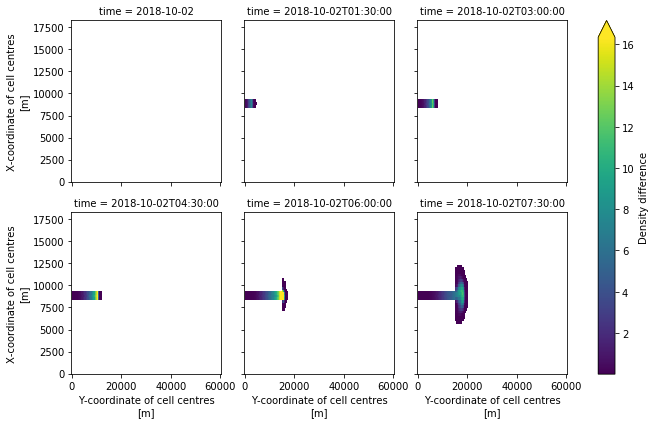

In [16]:
# delta_rho.isel(time=selected_outputstep, M=31).plot()
delta_rho.isel(time=slice(0,-1,15), KMAXOUT_RESTR=77).plot.pcolormesh('YZ', 'XZ', col='time', col_wrap=3,
            robust=True, cmap='viridis', cbar_kwargs={'label': 'Density difference'})

### Step 2: Calculate modified gravity constant
The modified gravitational acceleration due to the Boussinesq approximation

$g' = \frac{\Delta \rho g}{\rho}=\frac{(\rho_{flow}-\rho)g}{\rho}$

In [17]:
mod_grav_accelaration = (delta_rho * gravity_constant)/ambient_density
mod_grav_accelaration.dims

('time', 'M', 'N', 'KMAXOUT_RESTR')

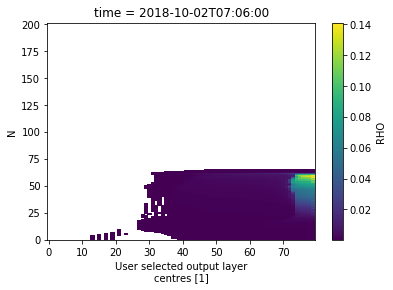

In [18]:
mod_grav_accelaration.isel(time=selected_outputstep, M=31).plot()

### Step 3: Calculate celerity
Celerity is velocity of wave propagation

The celerity of a long wave propagating along the interface between the denser current and less dense ambient water 

$\sqrt{g'\cdot L}$
Where l is layer thickness (THIS IS NOT CORRECT!)

In [19]:
# inflow_depth = trim.layer_thickness.isel(KMAXOUT_RESTR=slice(29,-1), N=1,M=31).sum()
# channel_depth = 30 # [m]

In [20]:
celerity = np.sqrt(mod_grav_accelaration * trim.layer_thickness) # channel_depth
celerity.max()

<xarray.DataArray ()>
array(1.0004007, dtype=float32)

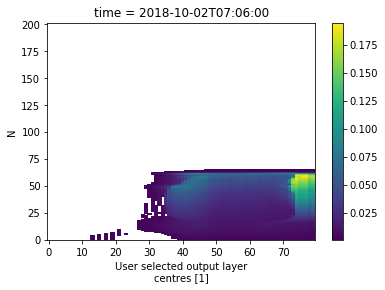

In [21]:
celerity.isel(time=selected_outputstep, M=31).plot()

## Step 4: Calculate the densimetric Froude number

In [22]:
layers = trim.SIG_LYR.isel(KMAXOUT_RESTR=slice(nr_of_discharge_layers, -1))
velocities = trim.velocity.isel(time=selected_outputstep, M=31, KMAXOUT_RESTR=slice(nr_of_discharge_layers, -1))

In [23]:
depth = trim.depthcenter.isel(time=selected_outputstep, M=31, KMAXOUT_RESTR=-1).values

In [44]:
# def calc_depth_avg_vel(velocities, depth, layers=[100,80,60,45,33,23,15,9,5,2]):
#     '''Calculate the depth averaged velocity if using a layered model
#     layers: the percentage of depth in the water column at which velocity points are measured [enter in %]
#     '''
#     layers = np.array(layers)*0.01*depth
#     dav = np.trapz(velocities, layers, dx = 0.001, axis = -1)/depth # Integrate along the given axis using the composite trapezoidal rule
#     return dav

# def calc_froude(dav, depth):
#     '''Calculate the froude number using depth averaged velocity and depth'''
#     fr  = np.abs(dav)/np.sqrt(gravity_constant * np.abs(depth))
#     return fr

In [24]:
# ddav = calc_depth_avg_vel(velocities, depth, layers.values)
# calc_froude(ddav, depth)

In [25]:
densi_froude = velocity_at_time/celerity
# densi_froude = densi_froude.fillna(0)

In [26]:
densi_froude.max()

<xarray.DataArray ()>
array(1791.582, dtype=float32)

In [27]:
plot_densi_froude = densi_froude.transpose('time', 'KMAXOUT_RESTR', 'M', 'N').isel(time=selected_outputstep)
plot_densi_froude.coords

/Users/julesblom/.local/share/virtualenvs/ThesisPython-OwMgd5UG/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  """Entry point for launching an IPython kernel.


Coordinates:
    XZ             (M, N) float32 0.0 0.0 0.0 0.0 ... 18150.0 18150.0 18150.0
    YZ             (M, N) float32 -50.0 250.0 550.0 ... 59650.0 59950.0 60250.0
    SIG_LYR        (KMAXOUT_RESTR) float32 -0.0359 -0.1018 ... -0.99955 -0.99985
  * KMAXOUT_RESTR  (KMAXOUT_RESTR) int32 0 1 2 3 4 5 6 ... 73 74 75 76 77 78 79
    time           datetime64[ns] 2018-10-02T07:06:00

In [28]:
plot_density = trim.RHO.isel(time=selected_outputstep, M=31)
plot_density = plot_density.where(plot_density.values > 1025.)
plot_density.dims

('KMAXOUT_RESTR', 'N')

In [29]:
hmm_velocity = trim.velocity.isel(time=selected_outputstep, M=31)
filtered_hmm_velocity = hmm_velocity.where(hmm_velocity.values > 0.01)
plot_velocity = filtered_hmm_velocity.transpose('KMAXOUT_RESTR', 'N')
plot_velocity.dims

/Users/julesblom/.local/share/virtualenvs/ThesisPython-OwMgd5UG/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  This is separate from the ipykernel package so we can avoid doing imports until


('KMAXOUT_RESTR', 'N')

## Plots to compare

### Density

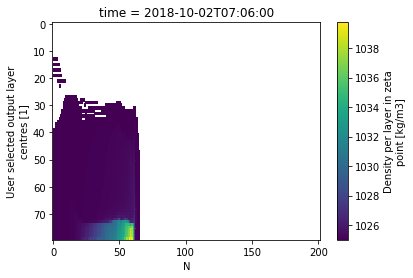

In [30]:
plot_density.plot(yincrease=False)

### Velocity

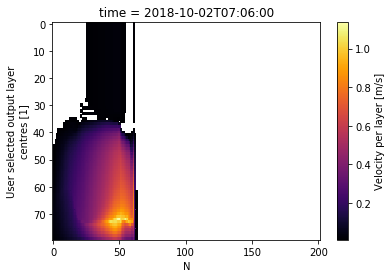

In [31]:
plot_velocity.plot(cmap='inferno', yincrease=False)

### Densimetric Froude

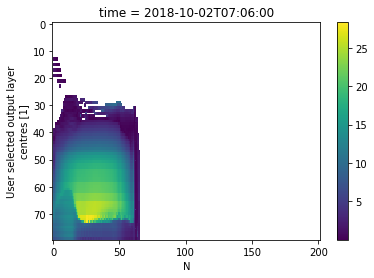

In [32]:
plot_densi_froude.isel(M=31).plot(yincrease=False) 

# Richardson nr
Richardson number is the dimensionless number that expresses the ratio of the buoyancy term to the flow shear term.
Richardson number can be used to predict the occurrence of fluid turbulence and, hence, the destruction of density currents in water or air.
## Relation Froude nr to 

$Fr = \frac{1}{\sqrt{Ri}}$

In [27]:
trim.RICH

<xarray.DataArray 'RICH' (time: 171, KMAXOUT: 81, M: 62, N: 152)>
[130531824 values with dtype=float32]
Coordinates:
    XZ        (M, N) float64 ...
    YZ        (M, N) float64 ...
    SIG_INTF  (KMAXOUT) float32 ...
  * KMAXOUT   (KMAXOUT) int32 0 1 2 3 4 5 6 7 8 9 ... 72 73 74 75 76 77 78 79 80
  * time      (time) datetime64[ns] 2018-10-02 ... 2018-10-02T17:00:00
    depth     (time, M, N, KMAXOUT) float32 ...
Dimensions without coordinates: M, N
Attributes:
    long_name:  Richardson number
    units:      1
    grid:       grid
    location:   face

In [83]:
plot_richardson = trim.RICH.isel(M=31)
filtered_plot_richardson = plot_richardson.where(plot_richardson.values > 0.0)

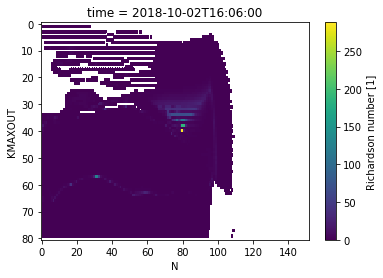

In [84]:
filtered_plot_richardson.isel(time=selected_outputstep).plot(yincrease=False)

In [85]:
filtered_plot_richardson.isel(time=selected_outputstep).hvplot.quadmesh('N_KMAXOUT', 'depth', 
#                         groupby='time',
                        rasterize=True,
                        grid=False,
                        cmap='viridis',
                        width=750, height=400,
                        colorbar=True,
                        legend=True,
                        clim=(0,150),
                        clabel=filtered_plot_richardson.attrs['units'],
                        ylim=(-850,-250),
                        attr_labels=True, #use an xarray object's attributes as labels
                        dynamic=True,
                       )

:DynamicMap   []
   :Image   [N_KMAXOUT,depth]   (RICH)

In [86]:
test_Fr = 1 / np.sqrt(filtered_plot_richardson)

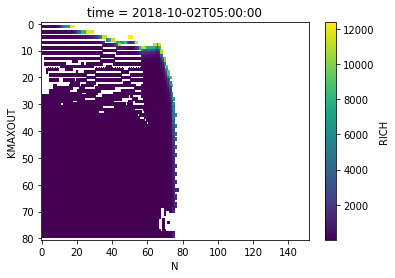

In [87]:
test_Fr.isel(time=50).plot(yincrease=False, clim=(0,5))

In [59]:
test_Fr.isel(time=50).hvplot.quadmesh('N_KMAXOUT', 'depth', 
#                         groupby='time',
                        rasterize=True,
                        grid=False,
                        cmap='viridis',
                        width=750, height=400,
                        colorbar=True,
                        legend=True,
                        clim=(0,100),
                        clabel=filtered_plot_richardson.attrs['units'],
                        ylim=(-850,-250),
                        attr_labels=True, #use an xarray object's attributes as labels
                        dynamic=True,
                       )

:DynamicMap   []
   :Image   [N_KMAXOUT,depth]   (RICH)

# Reynolds Nr

$Re = \frac{Uh}{\nu}$

Where kinematic viscosity $\nu$ is the ratio of fluid viscosity $\mu$ over fluid density $\rho$

$\nu = \frac{\mu}{\rho}$

In [32]:
kin_visco = 0.000890 #Pa·s

## hvplot prep

In [93]:
_, mesh_N_intf = np.meshgrid(trim.SIG_INTF.values, trim.YZ[0])
_, mesh_N_lyr = np.meshgrid(trim.SIG_LYR.values, trim.YZ[0])

In [95]:
trim.KMAXOUT_RESTR

<xarray.DataArray 'KMAXOUT_RESTR' (KMAXOUT_RESTR: 80)>
array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79], dtype=int32)
Coordinates:
    SIG_LYR        (KMAXOUT_RESTR) float32 -0.0359 -0.1018 ... -0.99955 -0.99985
    KMAXOUT        (KMAXOUT_RESTR) int32 0 1 2 3 4 5 6 ... 73 74 75 76 77 78 79
  * KMAXOUT_RESTR  (KMAXOUT_RESTR) int32 0 1 2 3 4 5 6 ... 73 74 75 76 77 78 79
Attributes:
    long_name:  User selected output layer centres
    units:      1
    compress:   SIG_LYR

In [97]:
# N_KMAXOUT = xr.DataArray(mesh_N_intf, dims=['N', 'KMAXOUT'], 
#                   coords={'N': trim.N, 'KMAXOUT': trim.KMAXOUT},
#                    attrs={'units':'m', 'long_name': 'Y-SIG_INTF Meshgrid'})#'Y-coordinate of cell centres'})) 

In [92]:
N_KMAXOUT_RESTR = xr.DataArray(mesh_N_lyr, dims=['N', 'KMAXOUT_RESTR'], 
                            coords={'N': trim.N, 'KMAXOUT': trim.KMAXOUT_RESTR},
                            attrs={'units':'m', 'long_name': 'Y-SIG_LYR Meshgrid'})#'Y-coordinate of cell centres'})

In [91]:
# Add NKMAXOUT and NKMAXOUT_RESTR coords to DataSet
trim.coords["N_KMAXOUT"] = N_KMAXOUT
trim.coords["N_KMAXOUT_RESTR"] = N_KMAXOUT_RESTR

## Richardson nr hvPlot

In [37]:
filtered_plot_richardson.coords

Coordinates:
    XZ        (N) float64 ...
    YZ        (N) float64 ...
    SIG_INTF  (KMAXOUT) float32 ...
  * KMAXOUT   (KMAXOUT) int32 0 1 2 3 4 5 6 7 8 9 ... 72 73 74 75 76 77 78 79 80
  * time      (time) datetime64[ns] 2018-10-02 ... 2018-10-02T17:00:00
    depth     (time, N, KMAXOUT) float32 ...

In [38]:
# filtered_plot_richardson.coords["N_KMAXOUT"] = N_KMAXOUT
# # filtered_plot_richardson.coords["depth"] = trim.depth

In [39]:
# filtered_plot_richardson.hvplot.quadmesh('N_KMAXOUT', 'depth', 
#                         groupby='time',
#                         rasterize=True,
#                         grid=False,
#                         cmap='viridis',
#                         width=750, height=400,
#                         colorbar=True,
#                         legend=True,
#                         clim=(0,150),
#                         clabel=filtered_plot_richardson.attrs['units'],
#                         ylim=(-850,-250),
#                         attr_labels=True, #use an xarray object's attributes as labels
#                         dynamic=True,
#                        )

### Densimetric Froude nr hvPlot

In [98]:
densi_froude.coords["N_KMAXOUT_RESTR"] = N_KMAXOUT_RESTR
densi_froude.coords["depth_center"] = trim.depth_center

In [99]:
densi_froude.coords

Coordinates:
    XZ               (M, N) float64 ...
    YZ               (M, N) float64 ...
    SIG_LYR          (KMAXOUT_RESTR) float32 -0.0359 -0.1018 ... -0.99985
  * KMAXOUT_RESTR    (KMAXOUT_RESTR) int32 0 1 2 3 4 5 6 ... 74 75 76 77 78 79
  * time             (time) datetime64[ns] 2018-10-02 ... 2018-10-02T17:00:00
  * N                (N) int64 0 1 2 3 4 5 6 7 ... 145 146 147 148 149 150 151
    KMAXOUT          (KMAXOUT_RESTR) int32 0 1 2 3 4 5 6 ... 74 75 76 77 78 79
    N_KMAXOUT_RESTR  (N, KMAXOUT_RESTR) float64 -50.0 -50.0 ... 4.525e+04
    depth_center     (time, M, N, KMAXOUT_RESTR) float32 ...

In [100]:
densi_froude.isel(M=31).hvplot.quadmesh('N_KMAXOUT_RESTR', 'depth_center', 
                        groupby='time',
                        rasterize=True,
                        grid=False,
                        cmap='viridis',
                        width=750, height=400,
                        colorbar=True,
                        legend=True,
                        clim=(0,1),
#                         clabel=densi_froude.attrs['units'],
                        ylim=(-850,-250),
                        attr_labels=True, #use an xarray object's attributes as labels
                        dynamic=True,
                       )

:DynamicMap   [time]
   :Image   [N_KMAXOUT_RESTR,depth_center]   (value)

In [ ]:
densi_froude.dims

In [ ]:
densi_froude.isel(KMAXOUT_RESTR=78).hvplot.quadmesh('XZ', 'YZ', 
                        groupby='time',
                        rasterize=True,
                        grid=False,
                        cmap='viridis',
                        width=400, height=750,
                        colorbar=True,
                        legend=True,
                        clim=(0,20),
#                         clabel=densi_froude.attrs['units'],
                        attr_labels=True, #use an xarray object's attributes as labels
#                         dynamic=True,
                       )